<a href="https://colab.research.google.com/github/GabrielMassolari/data_projects/blob/main/Analise_de_dados_Airbnb_Rio_de_Janeiro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Análise de dados do Airbnb na cidade do Rio de Janeiro**

![Rio de Janeiro Image](https://www.melhoresdestinos.com.br/wp-content/uploads/2019/08/rio-de-janeiro-capa2019-01.jpg)


O ***Airbnb*** é uma famosa plataforma, conhecida mundialmente, que é destaque no serviço de hospedagens de hotéis, casas e acomodações em geral. Auxiliando assim, o viajante que deseja se hospedar em algum lugar, e o proprietário de casas/hotéis a divulgar o seu serviço de hospedagem.

A empresa possui uma interessante iniciativa de divulgar seus dados dentro de seu [site](http://insideairbnb.com/get-the-data/). A cidade escolhida para realização do projeto foi o **Rio de Janeiro**, por ser uma cidade bastante visitada do Brasil. Foi utilizado para o projeto um conjunto de dados resumido com  data de compilação de **22 de junho de 2022**.

Sendo assim, esse projeto tem como objetivo realizar uma simples análise dos dados da cidade, visualizando por exemplo algumas informações e insights.

In [ ]:
# Instalação de Bibliotecas
!pip install pywaffle -q
!pip install wordcloud -q
!pip install geopandas -q
!pip install nltk -q

In [ ]:
# Importação das Bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
from pywaffle import Waffle
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import geopandas as gpd
from google.colab import output
import nltk
from PIL import Image

In [ ]:
df = pd.read_csv("http://data.insideairbnb.com/brazil/rj/rio-de-janeiro/2022-06-20/visualisations/listings.csv")

A seguir, o dicionário das variáveis do conjunto de dados em estudo.

## Dicionário das variáveis

* `id` - número de id gerado para identificar o imóvel
* `name` - nome da propriedade anunciada
* `host_id` - número de id do proprietário (anfitrião) da propriedade
* `host_name` - Nome do anfitrião
* `neighbourhood_group` - Não contém nenhum valor válido
* `neighbourhood` - nome do bairro
* `latitude` - coordenada da latitude da propriedade
* `longitude` - coordenada da longitude da propriedade
* `room_type` - informa o tipo de quarto que é oferecido
* `price` - preço para alugar o imóvel
* `minimum_nights` - quantidade mínima de noites para reservar
* `number_of_reviews` - número de reviews que a propriedade possui
* `last_review` - data do último review
* `reviews_per_month` - quantidade de reviews por mês
* `calculated_host_listings_count` - quantidade de imóveis do mesmo anfitrião
* `availability_365` - número de dias de disponibilidade dentro de 365 dias
* `number_of_reviews_ltm` - número de reviews nos últimos 12 meses
* `license` - Não contém nenhum valor válido

In [ ]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,17878,"Very Nice 2Br in Copacabana w. balcony, fast WiFi",68997,Matthias,NaN,Copacabana,-22.96599,-43.17940,Entire home/apt,350,5,272,2022-04-23,1.87,1,311,8,NaN
1,556930647599893392,Venha passar uma pernoite em um veleiro na Urca!,198206849,Andréia,NaN,Urca,-22.94781,-43.16351,Private room,280,1,1,2022-02-19,0.25,1,365,1,NaN
2,1174007,100% Best View In Copa In Suite 2,3962758,Thiago Luiz,NaN,Copacabana,-22.97277,-43.17966,Private room,107,2,177,2022-06-07,1.69,6,357,29,NaN
3,8410797,Ipanema(Arpoador) 100mdo Mar/ Jan & Carnaval +Fev,42038091,Sheila,NaN,Ipanema,-22.98871,-43.19334,Private room,1000,3,1,2017-09-28,0.02,3,362,0,NaN
4,28053241,Navegar a Bordo de um Veleiro Francês no Rio!,193860988,Luciano,NaN,Urca,-22.95056,-43.17175,Private room,1850,2,0,NaN,NaN,1,180,0,NaN


## Q1: Quantas variáveis (colunas) e quantas entradas há neste conjunto de dados? Quais os tipos das variáveis?

In [ ]:
print(f"Número de variáveis(colunas): {df.shape[1]}")
print(f"Número de entradas(Total de Dados): {df.shape[0]}\n")
print("TIPO DAS VARIÁVEIS:")
print(df.dtypes)

Número de variáveis(colunas): 18
Número de entradas(Total de Dados): 24881

TIPO DAS VARIÁVEIS:
id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                           float64
dtype: object


In [ ]:
df.dtypes.value_counts()

int64      8
object     5
float64    5
dtype: int64

Este conjunto de dados possui o total de 17 colunas, sendo 8 colunas de inteiros, 5 colunas de texto e 5 colunas de números decimais, além disso possui 24881 entradas de dados.

## Q2: Há valores fora do padrão (outlier) e valores faltantes?

In [ ]:
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,24881.000000,24881.000000,24881.000000,17213.000000,24881.000000,24881.000000
mean,745.395884,5.358426,16.818818,0.812952,8.020297,214.774165
std,4983.640074,26.044111,36.859241,1.011219,22.311380,131.693681
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,180.000000,1.000000,0.000000,0.130000,1.000000,89.000000
50%,300.000000,2.000000,3.000000,0.450000,1.000000,212.000000
75%,600.000000,4.000000,15.000000,1.100000,4.000000,356.000000
max,591723.000000,1125.000000,534.000000,18.740000,184.000000,365.000000


A partir da visualização da tabela acima, pode-se analisar que as colunas `minimum_nights` e `price` possuem **valores máximos fora do padrão**, precisando de uma **análise mais detalhada**.

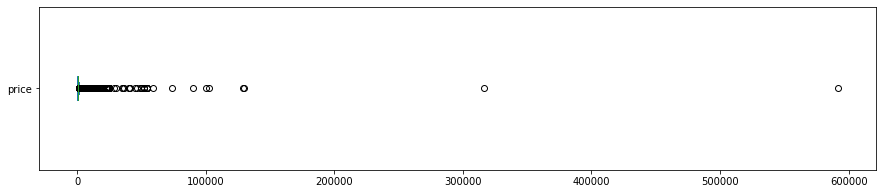

In [ ]:
df['price'].plot(kind='box', vert=False, figsize=(15, 3),)
plt.show()

Pode-se observar que há alguns valores muito fora do padrão, como por exemplo o preço máximo de **R$591.723,00**

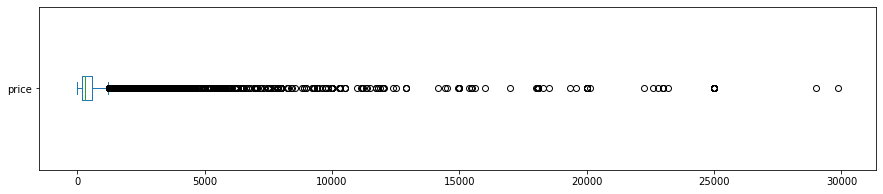

[price]: Valores acima de R$ 10000,00:
-- 124 entradas --
-- 0.4984% dos dados --
[price]: Valores abaixo de R$ 10000,00:
-- 99.4011% dos dados --


In [ ]:
df[df['price'] < 30000]['price'].plot(kind='box', vert=False, figsize=(15, 3),)
plt.show()
print("[price]: Valores acima de R$ 10000,00:")
print(f"-- {len(df[df.price > 10000])} entradas --")
print("-- {:.4f}% dos dados --".format((len(df[df.price > 10000]) / df.shape[0])*100))
print("[price]: Valores abaixo de R$ 10000,00:")
print("-- {:.4f}% dos dados --".format((len(df[df.price < 10000]) / df.shape[0])*100))

Isolando os valores em um escopo de até **R$ 30.000,00** pode-se perceber que os valores estão todos concentrados até o valor de **10 mil reais**, o que equivale a **99,40%** dos dados.

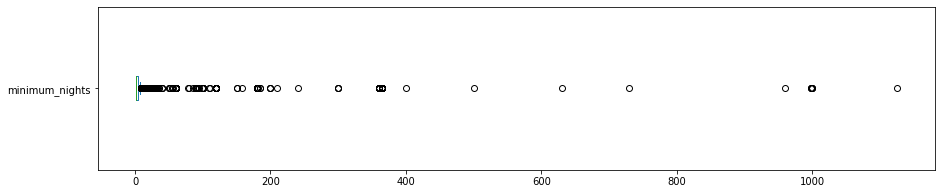

In [ ]:
df['minimum_nights'].plot(kind='box', vert=False, figsize=(15, 3),)
plt.show()

É possível visualizar que também há alguns dados **fora do padrão** no que se diz respeito aos **dias mínimos** de hospedagem.

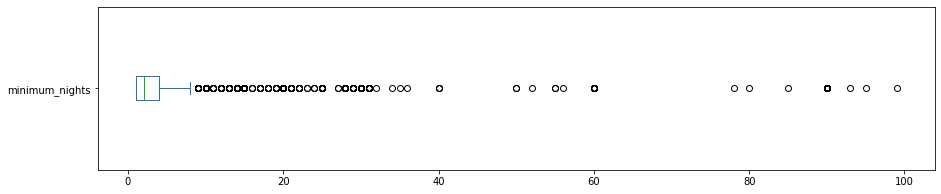

[minimum_nights]: Valores acima de 40 dias:
-- 255 entradas
-- 1.0249%
[minimum_nights]: Valores abaixo de 40 dias:
-- 98.9631%


In [ ]:
df[df['minimum_nights'] < 100]['minimum_nights'].plot(kind='box', vert=False, figsize=(15, 3),)
plt.show()
print("[minimum_nights]: Valores acima de 40 dias:")
print(f"-- {len(df[df.minimum_nights > 40])} entradas")
print("-- {:.4f}%".format((len(df[df.minimum_nights > 40]) / df.shape[0])*100))
print("[minimum_nights]: Valores abaixo de 40 dias:")
print("-- {:.4f}%".format((len(df[df.minimum_nights < 40]) / df.shape[0])*100))

Isolando os valores em um escopo de até **100 dias** pode-se perceber que os valores estão mais **concentrados** até a faixa de **40 dias**, o que equivale a **98,96%** dos dados.

Abaixo consta a porcentagem de **valores faltantes** em cada coluna.

In [ ]:
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False) * 100

license                           100.000000
neighbourhood_group               100.000000
reviews_per_month                  30.818697
last_review                        30.818697
host_name                           0.470238
name                                0.084402
number_of_reviews                   0.000000
number_of_reviews_ltm               0.000000
availability_365                    0.000000
calculated_host_listings_count      0.000000
id                                  0.000000
minimum_nights                      0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_id                             0.000000
price                               0.000000
dtype: float64

As colunas `license` e `neighbourhood_group` estão **vazias** por completa. Além disso, as colunas `reviews_per_month` e `last_review` possuem  **30,81%** de dados faltantes. E as colunas `host_name` e `name` há um baixo valor de dados faltantes, representando menos de **1%** dos dados.

Após a análise das váriaveis, foi realizada a limpeza desses dados, realizando as seguintes alterações:
- Remoção das **colunas** `neighbourhood_group` e `license`
- Remoção dos **valores maiores que 10000** na coluna `price`
- Remoção dos **valores maiores que 40** na coluna `minimum_nights`

In [ ]:
df_clean = df.copy()
df_clean.drop(['neighbourhood_group', 'license'], axis=1, inplace=True)
df_clean.drop(df_clean[df_clean['price'] > 10000].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean['minimum_nights'] > 40].index, axis=0, inplace=True)

## Q3: Como ficou a distribuição dos dados após a limpeza dos dados? 

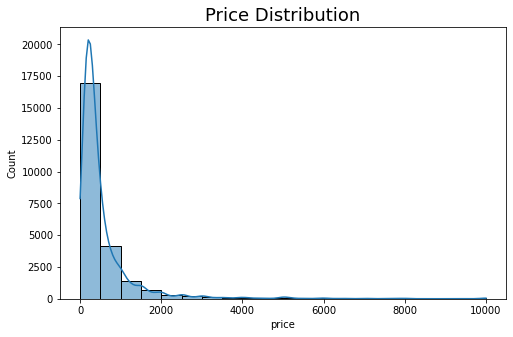

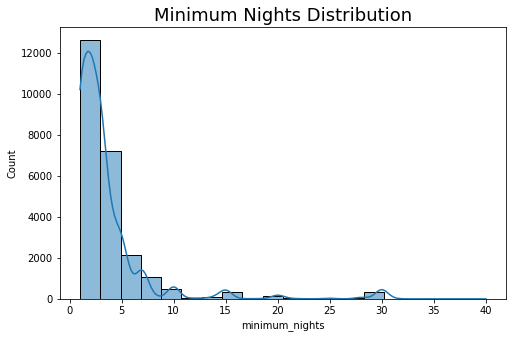

In [ ]:
plt.figure(figsize=(8,5))
sns.histplot(df_clean['price'], kde=True, bins=20)
plt.title('Price Distribution', fontsize=18)
plt.figure(figsize=(8,5))
sns.histplot(df_clean['minimum_nights'], kde=True, bins=20)
plt.title('Minimum Nights Distribution', fontsize=18)

plt.show()

## Q4: Qual o tipo de imóvel mais alugado no Rio de Janeiro?

A coluna `room_type` indica qual o tipo de imóvel que foi alugado, possuindo os seguintes tipos:
- ***Entire home/apt***: Apartamento/casa inteira
- ***Private room***: Apenas um quarto
- ***Shared Room***: Quarto compartilhado com outra pessoa
- ***Hotel room***: Quarto de hotel

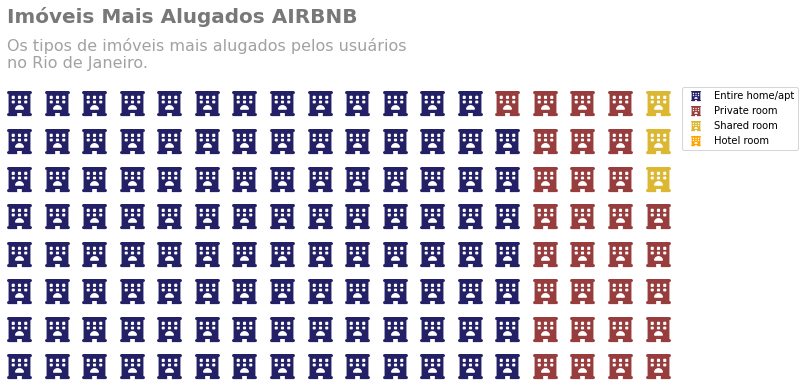

Entire home/apt    76.795039
Private room       21.120268
Shared room         1.811358
Hotel room          0.273336
Name: room_type, dtype: float64


In [ ]:
data = dict(df_clean['room_type'].value_counts())

fig = plt.figure(
    FigureClass=Waffle,
    figsize=(12,8),
    rows=8,
    columns=18,
    colors=("#232066", "#983D3D", "#DCB732", "#FFA500"),
    values=data, icons='hotel', icon_size=25,
    legend={'loc': 'upper left', 'bbox_to_anchor': (1,1)},
    icon_legend=True
)

plt.text(0, 1.2, 'Imóveis Mais Alugados AIRBNB',
         fontsize=20, 
         color="#787878",
         weight='bold')

plt.text(0, 1.15,
         "Os tipos de imóveis mais alugados pelos usuários\n"
         "no Rio de Janeiro.",
         verticalalignment="top",
         fontsize=16,
         color="#A2A1A3")

fig.set_tight_layout(False)
plt.show();
print(df_clean['room_type'].value_counts() / df_clean.shape[0] * 100)

É possível visualizar que grande parte dos alugueis é de **Casas ou Apartamentos Inteiros**, representando **76,79%** das hospedagens. Seguido do **Quarto Privado** com **21,12%**, **Quarto Compartilhado** com  **1,81%** e por último o **Quarto de Hotel** com **0,27%**.

## Q5: Em quais bairros do Rio de Janeiro possuem o maior número de locações de imóveis?

In [ ]:
df_clean['neighbourhood'].value_counts().head(10)

Copacabana                  7254
Ipanema                     2504
Barra da Tijuca             2408
Leblon                      1184
Recreio dos Bandeirantes    1144
Jacarepaguá                 1085
Botafogo                    1055
Santa Teresa                 887
Centro                       683
Flamengo                     522
Name: neighbourhood, dtype: int64

Na tabela acima é exibido os 10 bairros com o maior número de hospedagens no Rio de Janeiro, sendo o primeiro lugar o bairro de _Copacabana_!

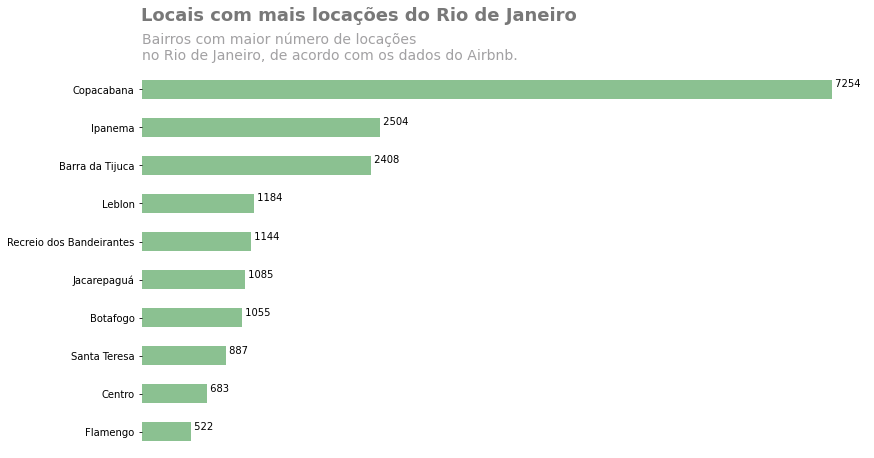

In [ ]:
CINZA1, CINZA2, CINZA3= "#CFCDCE", "#A2A1A3", "#787878"

fig, ax = plt.subplots(figsize= (13,7))
n_plots = 10
palette = sns.color_palette("crest", n_colors=n_plots)


with palette:
  ax = df_clean['neighbourhood'].value_counts().head(10)[::-1].plot.barh()


  plt.text(-2, 10.8, 'Locais com mais locações do Rio de Janeiro',
          fontsize=18, 
          color=CINZA3,
          weight='bold')


  plt.text(-0.35, 10.5,
          "Bairros com maior número de locações\n"
          "no Rio de Janeiro, de acordo com os dados do Airbnb.",
          verticalalignment="top",
          fontsize=14,
          color=CINZA2)


  initialx=0


  ax.spines['right'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_visible(False)


  ax.set_ylabel('')    
  ax.set_xlabel('')


  plt.tick_params(
    axis='both',         
    which='both',     
    bottom=False,      
    top=False,         
    labelbottom=False) 
    
    
  for p in ax.patches:
    ax.text(p.get_width(),initialx+p.get_height()/8,' {:1.0f}'.format(p.get_width()))
    initialx+=1
  plt.show()

Com o gráfico acima, pode-se analisar que os bairros mais procuradas pelos usuários são os bairros mais nobres e próximos as praias mais famosas

No mapa de calor abaixo pode-se visualizar a **distribuição dos imóveis alugados** na cidade.

In [ ]:
lat = df_clean['latitude'].to_list()
lng = df_clean['longitude'].to_list()
mapa = folium.Map(
        location=[-22.8205552, -43.3151299],
        tiles='Stamen Terrain',
        zoom_start=10
    )
HeatMap(list(zip(lat, lng)), blur=30).add_to(mapa)

mapa

## Q6: Os bairros mais procurados estão próximos dos pontos turísticos?

Um questionamento que pode ser levantado é se os bairros mais procurados são locais próximos aos principais pontos turísticos da cidade. Para testar essa hipótese será gerado um mapa com esses pontos juntamente com a marcação dos 15 bairros mais procurados de acordo com o AirBnb.

In [ ]:
nome_local = []
latitude = []
longitude = []

#Definição dos principais locais de visitação do Rio de Janeiro
nome_local.append('Cristo Redentor')
latitude.append(-22.95242046460928)
longitude.append(-43.21047096494433)

nome_local.append('Pao de Acucar')
latitude.append(-22.949731680708066)
longitude.append(-43.15654684733769)

nome_local.append('Museu do Amanha')
latitude.append(-22.895178064000717)
longitude.append(-43.179872024079984)

nome_local.append('Maracana')
latitude.append(-22.91212024682258)
longitude.append(-43.23015399787018)

nome_local.append('Lagoa de Freitas')
latitude.append(-22.973390420867627)
longitude.append(-43.21121567117298)

nome_local.append('Praia de Copacabana')
latitude.append(-22.969316183529163)
longitude.append(-43.17889304906611)

nome_local.append('Praia de Ipanema')
latitude.append(-22.987085654819385)
longitude.append(-43.204795504905135)

nome_local.append('Praia do Leblon')
latitude.append(-22.98727953868977)
longitude.append(-43.2211609627585)

nome_local.append('Praia da Barra da Tijuca')
latitude.append(-23.013005472324945)
longitude.append(-43.32008390801288)

nome_local.append('Arcos da Lapa')
latitude.append(-22.912766666469274)
longitude.append(-43.17991386570505)

nome_local.append('Jardim Botanico')
latitude.append(-22.967381037158784)
longitude.append(-43.22503596952804)

nome_local.append('Parque Lage')
latitude.append(-22.958322288499836)
longitude.append(-43.211689952408435)

nome_local.append('Parque dos Atletas')
latitude.append(-22.976757000147128)
longitude.append(-43.393331278509784)

In [ ]:
series_bairros_count = df_clean['neighbourhood'].value_counts().head(15)
df_count_bairros = pd.DataFrame({'neighbourhood': series_bairros_count.index, 'count': series_bairros_count.values})

geo_data = gpd.read_file("Limite_de_Bairros.shp")
geo_data.rename(columns={"NOME": "neighbourhood"}, inplace=True)
geo_data = geo_data.merge(df_count_bairros, on='neighbourhood')


mapa = folium.Map(
        location=[-22.8205552, -43.3151299],
        zoom_start=10
      )


folium.Choropleth(
            geo_data=geo_data,
            data=df_count_bairros,
            columns=['neighbourhood', 'count'],  
            fill_color='YlOrRd',
            key_on = 'feature.properties.neighbourhood',
            nan_fill_color="White", 
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name='Quantidade de locações por bairro', 
            highlight=True,
            line_color='black').add_to(mapa)


folium.features.GeoJson(
                    data=geo_data,
                    name='neighbourhood',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['neighbourhood',
                                'count'
                               ],
                        aliases=["Bairro: ",
                                 "Quantidade de Locações: "
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                          highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(mapa)

for i in range(len(nome_local)):
  folium.Marker(location=[latitude[i], longitude[i]],
              popup=nome_local[i],
              icon=folium.Icon(color='green', icon='info-sign')
              ).add_to(mapa)


mapa

Pode-se concluir por meio do mapa acima que os 15 bairros mais procurados da cidade estão nas redondezas dos principais pontos turísticos da cidade como o Cristo Redentor, Parque dos Atletas (onde ocorre grandes eventos na cidade), as principais praias e outros diversos locais.

## Q7: Qual a média de preço dos bairros do Rio de Janeiro?

In [ ]:
series_bairros = df_clean.groupby('neighbourhood')['price'].mean()
df_media_bairros = pd.DataFrame({'neighbourhood': series_bairros.index, 'mean_price': series_bairros.values})

In [ ]:
df_media_bairros.sort_values('mean_price', ascending=False)[:10]

,neighbourhood,mean_price
74,Joá,3317.806452
3,Anchieta,2719.000000
2,Alto da Boa Vista,1680.861111
129,São Conrado,1657.718919
7,Bangu,1246.636364
65,Itanhangá,1180.891473
114,Ribeira,1051.000000
92,Paciência,968.000000
75,Lagoa,960.537778
57,Gávea,888.530055


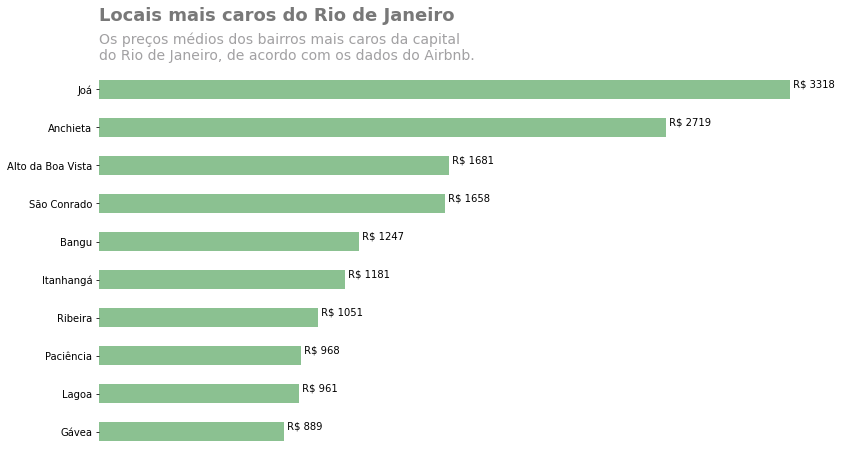

In [ ]:
CINZA1, CINZA2, CINZA3= "#CFCDCE", "#A2A1A3", "#787878"

fig, ax = plt.subplots(figsize= (13,7))
n_plots = 10
palette = sns.color_palette("crest", n_colors=n_plots)

with palette:
  ax = df_clean.groupby(['neighbourhood'])['price'].mean().sort_values(ascending=False)[:10][::-1].plot.barh()


  plt.text(-2, 10.8, 'Locais mais caros do Rio de Janeiro',
          fontsize=18, 
          color=CINZA3,
          weight='bold')
  

  plt.text(-0.35, 10.5,
          "Os preços médios dos bairros mais caros da capital\n"
          "do Rio de Janeiro, de acordo com os dados do Airbnb.",
          verticalalignment="top",
          fontsize=14,
          color=CINZA2)

  initialx=0


  ax.spines['right'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_visible(False)


  ax.set_ylabel('')    
  ax.set_xlabel('')


  plt.tick_params(
    axis='both',         
    which='both',     
    bottom=False,      
    top=False,         
    labelbottom=False) 
    

  for p in ax.patches:
    ax.text(p.get_width(),initialx+p.get_height()/8,' R$ {:1.0f}'.format(p.get_width()))
    initialx+=1
  plt.show()

Acima contém um gráfico com os bairros mais caros da cidade, sendo o local **mais caro o bairro Joá**, com uma média de **R$3318,00**.

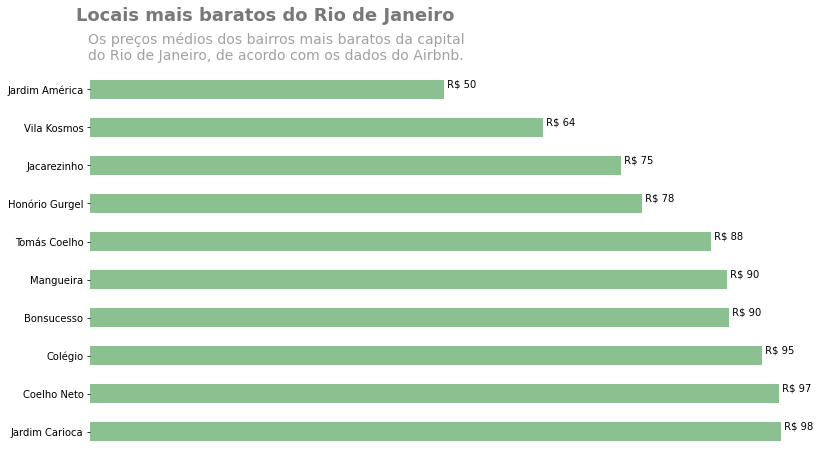

In [ ]:
CINZA1, CINZA2, CINZA3= "#CFCDCE", "#A2A1A3", "#787878"


fig, ax = plt.subplots(figsize= (13,7))
n_plots = 10
palette = sns.color_palette("crest", n_colors=n_plots)

with palette:
  ax = df_clean.groupby(['neighbourhood'])['price'].mean().sort_values(ascending=True)[:10][::-1].plot.barh()


  plt.text(-2, 10.8, 'Locais mais baratos do Rio de Janeiro',
          fontsize=18, 
          color=CINZA3,
          weight='bold')


  plt.text(-0.35, 10.5,
          "Os preços médios dos bairros mais baratos da capital\n"
          "do Rio de Janeiro, de acordo com os dados do Airbnb.",
          verticalalignment="top",
          fontsize=14,
          color=CINZA2)

  initialx=0


  ax.spines['right'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_visible(False)


  ax.set_ylabel('')    
  ax.set_xlabel('')

  plt.tick_params(
    axis='both',         
    which='both',     
    bottom=False,      
    top=False,         
    labelbottom=False) 
    

  for p in ax.patches:
    ax.text(p.get_width(),initialx+p.get_height()/8,' R$ {:1.0f}'.format(p.get_width()))
    initialx+=1
  plt.show()

Acima contém um gráfico com os bairros mais baratos da cidade, sendo o local **mais barato o bairro Jardim América**, com uma média de **R$50,00**.

In [ ]:
geo_data = gpd.read_file("Limite_de_Bairros.shp")
geo_data.rename(columns={"NOME": "neighbourhood"}, inplace=True)
geo_data = geo_data.merge(df_media_bairros, on='neighbourhood')

mapa = folium.Map(
        location=[-22.8205552, -43.3151299],
        zoom_start=10
      )


folium.Choropleth(
            geo_data=geo_data,
            data=df_media_bairros,
            columns=['neighbourhood', 'mean_price'],  
            fill_color='YlOrRd',
            key_on = 'feature.properties.neighbourhood',
            nan_fill_color="White", 
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name='Media de precos por bairro', 
            highlight=True,
            line_color='black').add_to(mapa)


folium.features.GeoJson(
                    data=geo_data,
                    name='neighbourhood',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['neighbourhood',
                                'mean_price'
                               ],
                        aliases=["Bairro:",
                                 "Média de Preço: R$"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                          highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(mapa)   


mapa

O **mapa coroplético** (choropleth map) acima demonstra a **média de preço de cada bairro** na capital, sendo que bairros com **cores mais fortes** representam uma média de **preço maior** (como pode ser analisado na legenda).

Ao analisar os dados, pode-se perceber que podem conter algumas informações de preços médios que não representam a realidade, visto que há bairros que posssuem muito poucas locações em relação a outros, prejudicando a análise estatística. Além disso, há alguns valores considerados _outliers_ em relação ao preço comum do bairro, sendo uma teoria para esse caso é que alguns usuários podem ter colocado o preço total de vários dias ao invés do preço diário, ou até mesmo digitado errado, alterando assim a média de preço das regiões

In [ ]:
print(f"- Bairros com menos de 10 locações: {np.sum(df_clean['neighbourhood'].value_counts() < 10)} bairros")

- Bairros com menos de 10 locações: 74 bairros


Como é possível visualizar, possuem ao todo **74 bairros** que possuem **menos de 10 locações**, o que **prejudica** a **análise de média** em relação aos outros **bairros que possuem mais aluguéis** de imóveis.

In [ ]:
df_clean[df_clean['neighbourhood'] == 'Anchieta']

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
6047,13514057,Rent home for Olympics,77573884,Plinio,Anchieta,-22.82838,-43.40549,Entire home/apt,4638,1,0,NaN,NaN,1,365,0
14762,41532220,Casa da Andressa,303489661,Geovana Vithoria,Anchieta,-22.81656,-43.38878,Shared room,800,3,0,NaN,NaN,2,90,0


Um exemplo dessa situação é o bairro **Anchieta** que possui apenas **dois imóveis locados** e um deles possui o preço de **R$4638.00**, o que tornou esse bairro o **segundo mais caro** do Rio de Janeiro de acordo com o **gráfico** mostrado anteriormente. Porém essa informação **talvez não demonstre a realidade**, pela pouca quantidade de dados e pelo fato de um dos **preço estar muito distante** do outro imóvel.

## Q8: Quais os preços médios dos bairros mais procurados?

Um questionamento que pode ser feito a partir dos dados é de qual seria a média de preços dos bairros mais procurados da cidade. Isso serve para que uma pessoa possa verificar se os bairros mais almejados turisticamente estão acessíveis para o seu orçamento.

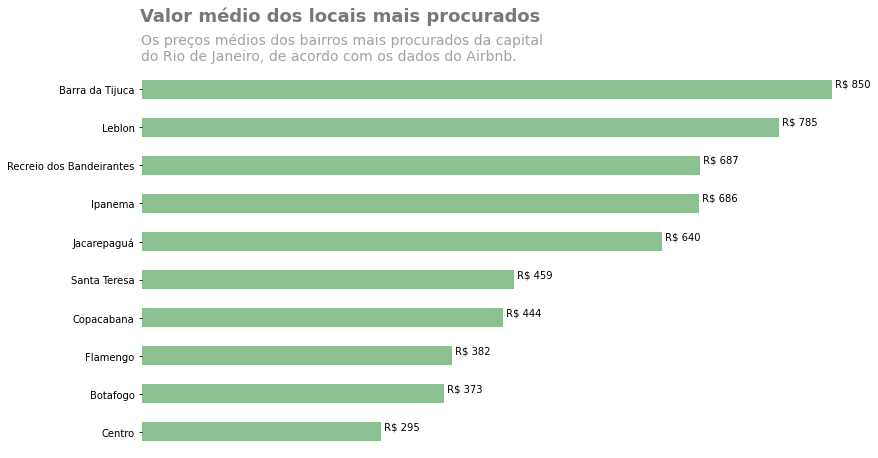

In [ ]:
CINZA1, CINZA2, CINZA3= "#CFCDCE", "#A2A1A3", "#787878"


fig, ax = plt.subplots(figsize= (13,7))
n_plots = 10
palette = sns.color_palette("crest", n_colors=n_plots)

with palette:
  ax = df_clean.groupby(['neighbourhood'])['price'].mean()[series_bairros_count.head(10).keys().tolist()].sort_values(ascending=False)[::-1].plot.barh()


  plt.text(-2, 10.8, 'Valor médio dos locais mais procurados',
          fontsize=18, 
          color=CINZA3,
          weight='bold')


  plt.text(-0.35, 10.5,
          "Os preços médios dos bairros mais procurados da capital\n"
          "do Rio de Janeiro, de acordo com os dados do Airbnb.",
          verticalalignment="top",
          fontsize=14,
          color=CINZA2)

  initialx=0


  ax.spines['right'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_visible(False)


  ax.set_ylabel('')    
  ax.set_xlabel('')

  plt.tick_params(
    axis='both',         
    which='both',     
    bottom=False,      
    top=False,         
    labelbottom=False) 
    

  for p in ax.patches:
    ax.text(p.get_width(),initialx+p.get_height()/8,' R$ {:1.0f}'.format(p.get_width()))
    initialx+=1
  plt.show()

Acima está o gráfico com os preços médios dos 10 bairros mais procurados da cidade.



Conforme visto anteriormente, os **bairros mais procurados** estão **próximos dos locais turístico** da cidade. Sendo assim, caso uma **pessoa queira visitar a cidade** e se **hospedar próximo a esses locais** para visita-los durante a viagem, e deseja **gastar menos**, uma boa opção é se hospedar no **Centro**, na qual possui o **menor preço médio** dentre os **10 bairros mais alugados**.

## Q9: Quais palavras mais utilizadas nos títulos dos anúncios dos imóveis?

Uma dos atributos presente nos dados de cada hospedagem, é o título. Sendo assim, é interessante ter conhecimento de quais palavras estão sendo mais utilizadas pelos anunciantes. Isso pode apresentar quais informações são mais divulgadas.

In [ ]:
nltk.download('stopwords')

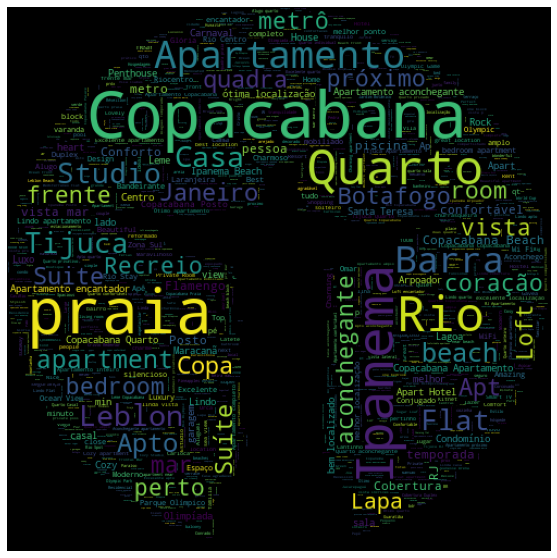

In [ ]:
stopwords = nltk.corpus.stopwords.words('portuguese') + nltk.corpus.stopwords.words('english')
titles_overview = df_clean.dropna(subset=['name'], axis=0)['name']
all_titles = " ".join(t for t in titles_overview)


img_mask = np.array(Image.open("mask_cristo_redentor.jpg"))

wordcloud = WordCloud(stopwords=stopwords,
                      background_color="black",
                      width=1000, height=1000, max_words=2000,
                      mask=img_mask, max_font_size=200,
                      min_font_size=1).generate(all_titles)

#imagem final
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

plt.imshow(wordcloud)
wordcloud.to_file("airbnb_titles_wordcloud.png")

Na figura acima, é possivel visualizar uma nuvem de palavras que foi formada a partir dos termos mais utilizados nos títulos das hospedagens. Sendo algumas das palavras utilizadas com maior frequência: 
- Copacabana
- Apartamento
- Praia
- Ipanema
- Quarto
- Casa
- Metrô
- Barra
- Perto

Essas palavras refletem que grande parte das hospedagens estão presentes próximos as principais praias da cidade, além de exibirem algumas informações como tipo do imóvel (Apartamento/Casa/Flat), o bairro, e se é próximo a algum local de interesse das pessoas como (metrô, praias e etc), além de diversas outras informações. 

## Conclusão

Mesmo tratando de uma análise mais simples, foi possível perceber que há diversos valores outliers(fora do padrão), principalmente referente aos preços das hospedagens. Além disso, outro fator que impactou a análise foi que algumas regiões tinham poucos imóveis, o que prejudicou as informações estatísticas, isso por que o conjunto de dados é de uma versão resumida.

Por fim, pode-se concluir que o processo de análise de dados auxilia muito a tomada de decisão em diversas áreas pois pode fornecer insights que antes não foram observados. E não é diferente com os dados do AirBnb do Rio de Janeiro, na qual foi possível perceber as áreas mais procuradas pelos turistas, as médias de preços, visualização de gráficos, mapas e etc. Vale ressaltar que essa análise foi superficial, realizada para fins de estudo e desenvolvimento pessoal.

